## Librerias

In [14]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from math import log10, sqrt
from skimage.draw import disk
from skimage.morphology import (erosion, dilation, closing, opening,
                                area_closing, area_opening)
import math
from skimage.morphology import (square, rectangle, diamond, disk, octagon)
from skimage import data, color, io
from skimage.segmentation import chan_vese
from skimage.color import rgb2gray
from skimage.segmentation import slic
from skimage import filters
from skimage.filters import gaussian
from skimage.segmentation import active_contour


## Lectura de Imagenes

## Función ruta imgs

In [15]:
def leer_imagenes_automatico(img_path):
    # Obtener lista de archivos en la carpeta
    files_names = os.listdir(img_path)
    
    # Asegurar que sea un archivo de imagen
    image_extensions = ['.tiff', '.png', '.jpg', '.jpeg']
    image_files = [file for file in files_names if os.path.splitext(file)[1].lower() in image_extensions]
    
    # Crear un diccionario donde las claves son 'ruta_imagen_1', 'ruta_imagen_2', etc.
    rutas_imagenes = {}
    for i, file in enumerate(image_files):
        ruta_imagen = os.path.join(img_path, file)
        rutas_imagenes[f"ruta_imagen_{i+1}"] = ruta_imagen
    
    return rutas_imagenes



In [16]:
img_path = r"C:\Users\Contratista\Desktop\VisionPc\violence_dataset\prueba"

rutas_imagenes = leer_imagenes_automatico(img_path)

#Revisar rutas
#for nombre_variable, ruta in rutas_imagenes.items():
#    print(f"{nombre_variable}: {ruta}")


## Función lectura formato imgs

In [17]:
def procesar_imagenes(rutas_imagenes):
    imagenes_procesadas = {}
    
    for nombre_variable, ruta in rutas_imagenes.items():
        input_image1 = cv2.imread(ruta, cv2.IMREAD_COLOR)  # Leer la imagen
        input_image = cv2.cvtColor(input_image1, cv2.COLOR_BGR2RGB)  # Convertir a RGB
        imagenes_procesadas[nombre_variable] = input_image
    
    return imagenes_procesadas


In [18]:
imagenes_procesadas = procesar_imagenes(rutas_imagenes)

# Imprimir el nombre de cada imagen procesada
#for nombre_variable, imagen in imagenes_procesadas.items():
#    print(f"{nombre_variable} procesada.")

In [19]:
#imagenes_procesadas

## Función subplot

In [20]:
# Función para mostrar las imágenes en un subplot con hasta 5 imágenes por fila
def mostrar_imagenes_en_subplots(imagenes_procesadas):
    num_imagenes = len(imagenes_procesadas)
    max_por_fila = 5
    
    # Calcular cuántas filas se necesitan
    num_filas = math.ceil(num_imagenes / max_por_fila)
    
    # Crear la figura y los subplots
    fig, axes = plt.subplots(num_filas, max_por_fila, figsize=(15, 3*num_filas))
    
    # Si solo hay una fila, asegurarse de que axes sea una lista
    if num_filas == 1:
        axes = [axes]
    
    # Mostrar las imágenes en los subplots
    for i, (nombre_variable, imagen) in enumerate(imagenes_procesadas.items()):
        fila = i // max_por_fila
        columna = i % max_por_fila
        ax = axes[fila][columna] if num_filas > 1 else axes[columna]
        
        # Verificar si la imagen es en escala de grises (2D) o en color (3D)
        if len(imagen.shape) == 2:
            ax.imshow(imagen, cmap='gray')  # Si es en escala de grises
        else:
            ax.imshow(imagen)  # Si es una imagen en color
            
        ax.set_title(f'Imagen {i+1}')  # Poner el título
        ax.axis('off')  # Desactivar los ejes
    
    # Ocultar subplots vacíos si hay menos imágenes que espacios
    for j in range(i+1, num_filas * max_por_fila):
        fila = j // max_por_fila
        columna = j % max_por_fila
        ax = axes[fila][columna] if num_filas > 1 else axes[columna]
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [21]:

# Función para mostrar las imágenes en un subplot con hasta 5 imágenes por fila
def mostrar_imagenes_en_subplots2(imagenes_procesadas):
    num_imagenes = len(imagenes_procesadas)
    max_por_fila = 5
    
    # Calcular cuántas filas se necesitan
    num_filas = math.ceil(num_imagenes / max_por_fila)
    
    # Crear la figura y los subplots
    fig, axes = plt.subplots(num_filas, max_por_fila, figsize=(15, 3*num_filas))
    
    # Si solo hay una fila, asegurarse de que axes sea una lista
    if num_filas == 1:
        axes = [axes]
    
    # Mostrar las imágenes en los subplots
    for i, (nombre_variable, imagen) in enumerate(imagenes_procesadas.items()):
        fila = i // max_por_fila
        columna = i % max_por_fila
        ax = axes[fila][columna] if num_filas > 1 else axes[columna]
        
        # Verificar si la imagen es en escala de grises (2D) o en color (3D)
        #if len(imagen.shape) == 2:
        #    ax.imshow(imagen, cmap='gray')  # Si es en escala de grises
        #else:
        #    ax.imshow(imagen)  # Si es una imagen en color
            
        ax.imshow(imagen)    
        ax.set_title(f'Imagen {i+1}')  # Poner el título
        ax.axis('off')  # Desactivar los ejes
    
    # Ocultar subplots vacíos si hay menos imágenes que espacios
    for j in range(i+1, num_filas * max_por_fila):
        fila = j // max_por_fila
        columna = j % max_por_fila
        ax = axes[fila][columna] if num_filas > 1 else axes[columna]
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

## Imagenes orginales

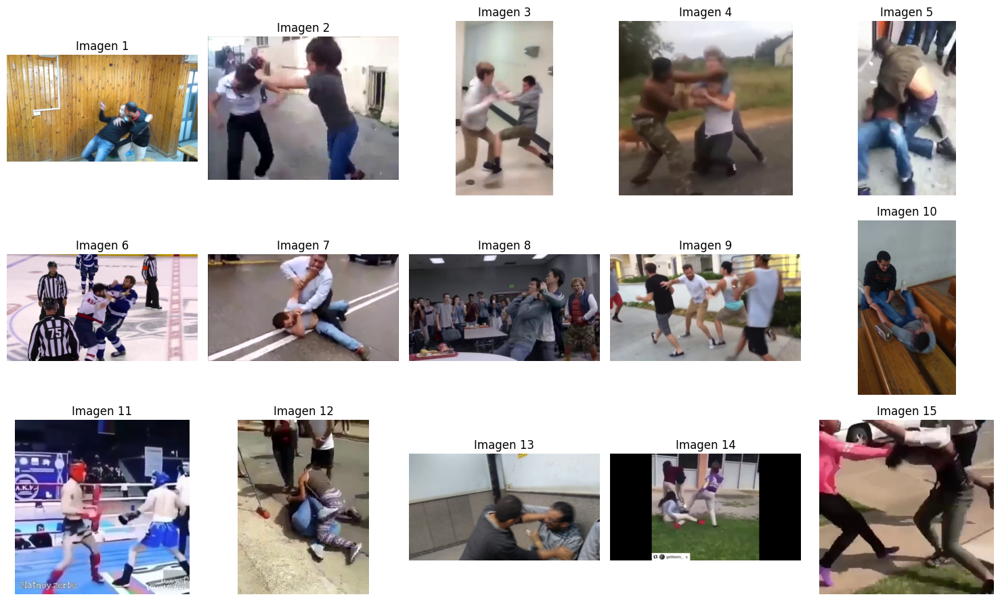

In [22]:
mostrar_imagenes_en_subplots(imagenes_procesadas)

## Función escala de grises

In [23]:
# Función para convertir imágenes a escala de grises
def convertir_imagenes_a_grises(imagenes_procesadas):
    imagenes_grises = {}
    
    # Convertir cada imagen a escala de grises
    for nombre_variable, imagen in imagenes_procesadas.items():
        image_gray = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)  # Convertir a escala de grises
        
        imagenes_grises[nombre_variable] = image_gray
    
    return imagenes_grises


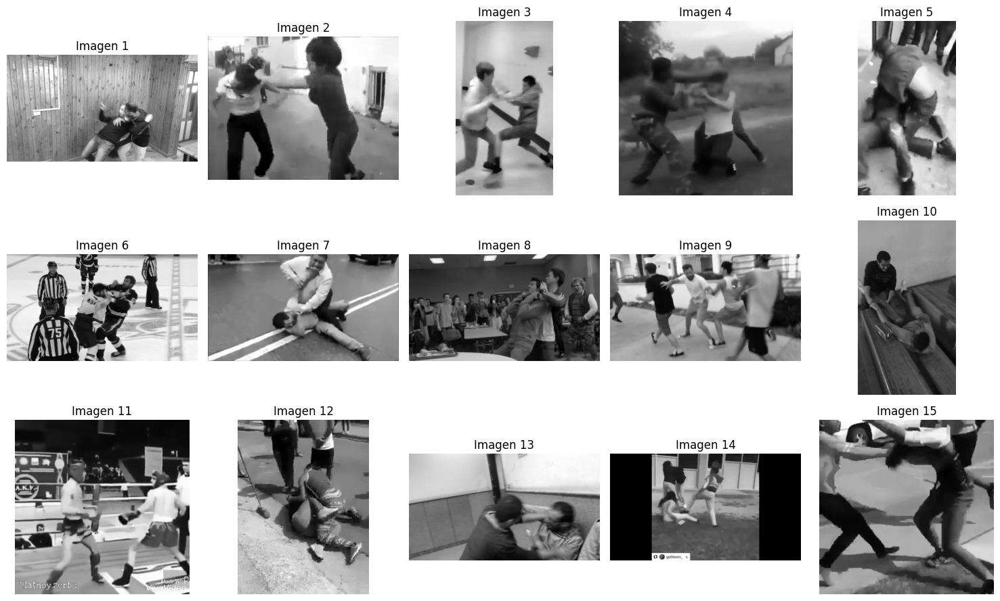

In [24]:
imagenes_grises = convertir_imagenes_a_grises(imagenes_procesadas)
mostrar_imagenes_en_subplots(imagenes_grises)

## Función espacios de color

In [25]:
def convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='RGB'):
    imagenes_convertidas = {}

    # Diccionario que mapea el tipo de espacio de color con el código de conversión de OpenCV
    espacios_de_color = {
        'RGB': cv2.COLOR_BGR2RGB,
        'HSV': cv2.COLOR_BGR2HSV,
        'LAB': cv2.COLOR_BGR2LAB,
        'YCrCb': cv2.COLOR_BGR2YCrCb,
        'YUV': cv2.COLOR_BGR2YUV,
        'HLS': cv2.COLOR_BGR2HLS,
        'XYZ': cv2.COLOR_BGR2XYZ
    }

    # Verificar si el espacio de color elegido está disponible
    if espacio_color not in espacios_de_color:
        raise ValueError(f"Espacio de color '{espacio_color}' no reconocido. Seleccione entre: {list(espacios_de_color.keys())}")

    # Convertir cada imagen al espacio de color seleccionado
    for nombre_variable, imagen in imagenes_procesadas.items():
        imagen_convertida = cv2.cvtColor(imagen, espacios_de_color[espacio_color])
        imagenes_convertidas[nombre_variable] = imagen_convertida

    return imagenes_convertidas

### RGB (Red, Green, Blue)

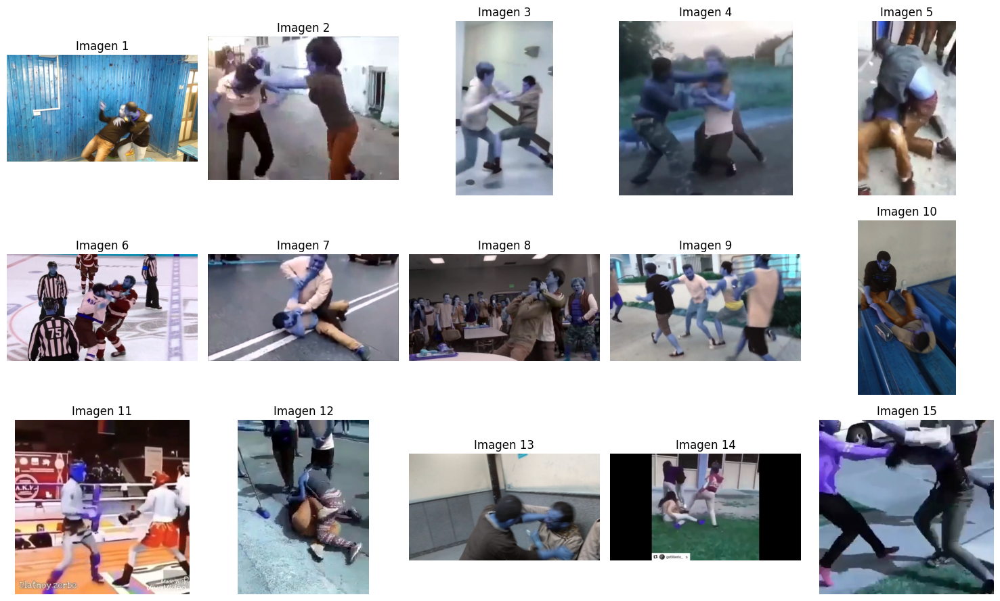

In [79]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='RGB')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### HSV (Hue, Saturation, Value)

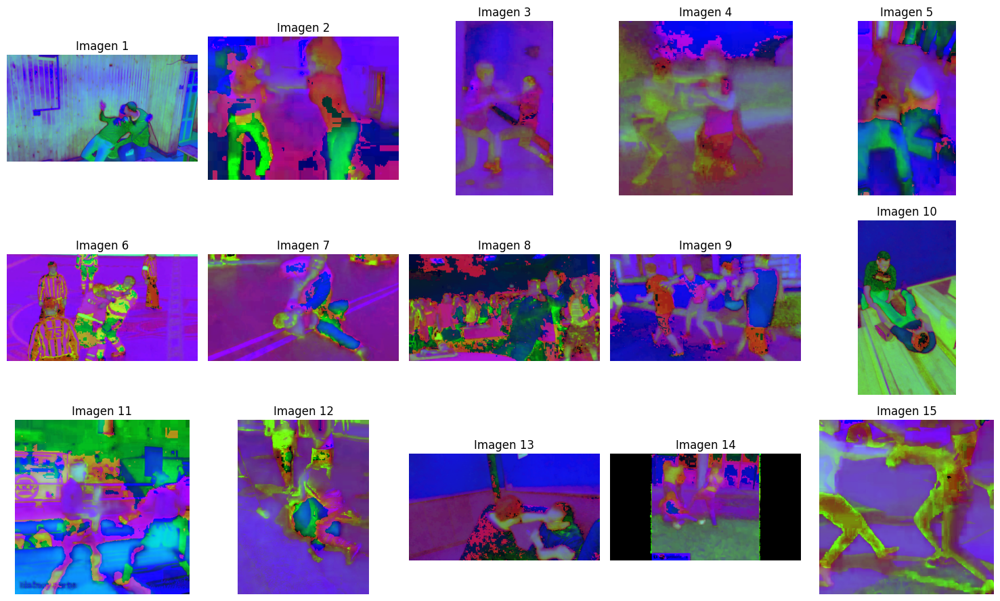

In [80]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='HSV')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### LAB (Luminance and Chrominance)

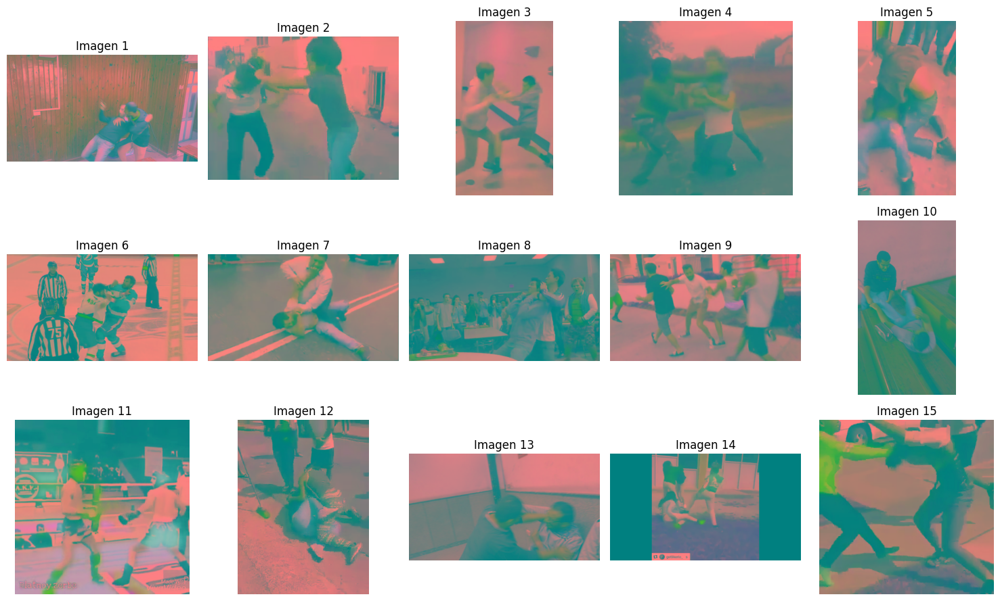

In [81]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='LAB')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### YCrCb (Luminance and Chrominance)

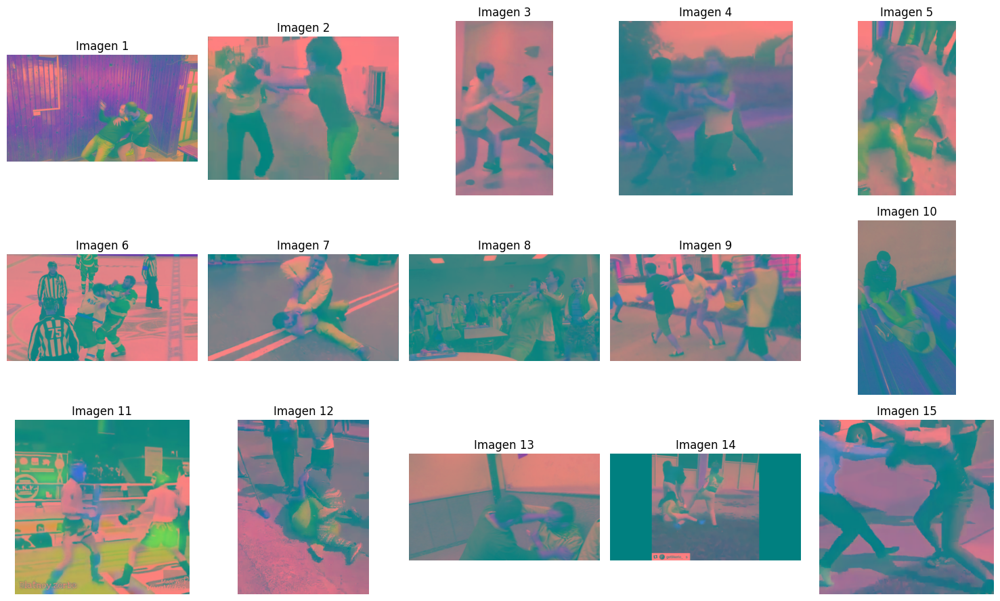

In [82]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='YCrCb')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### YUV (Luminance and Chrominance) 

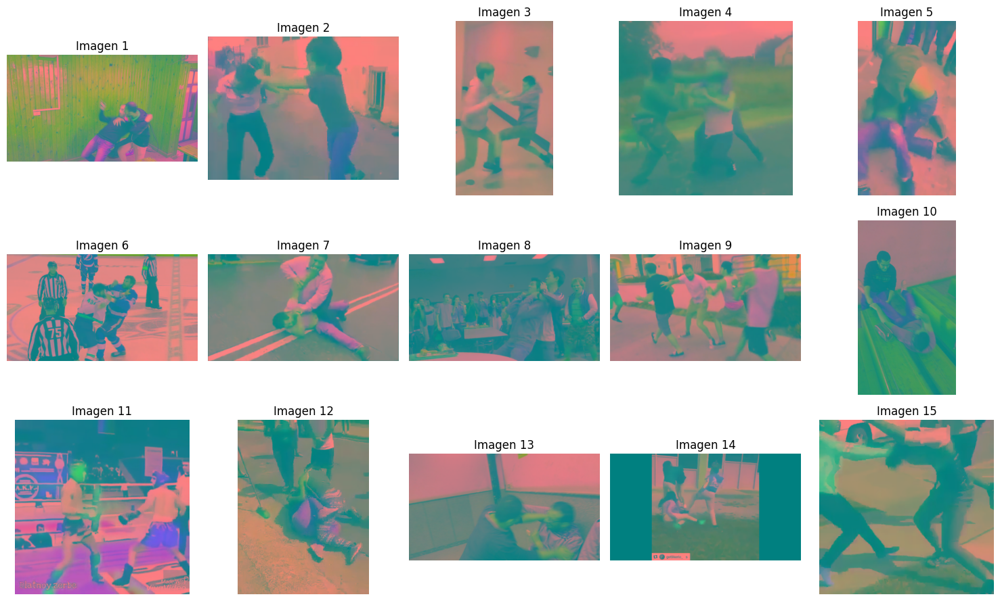

In [83]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='YUV')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### HLS (Hue, Lightness, Saturation)

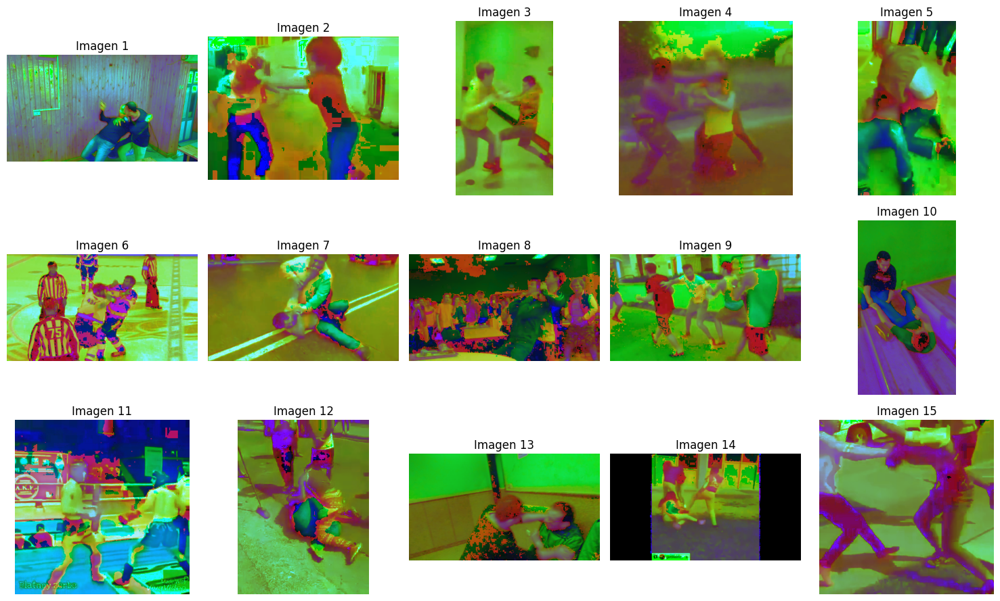

In [84]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='HLS')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

### XYZ (Tristimulus values)

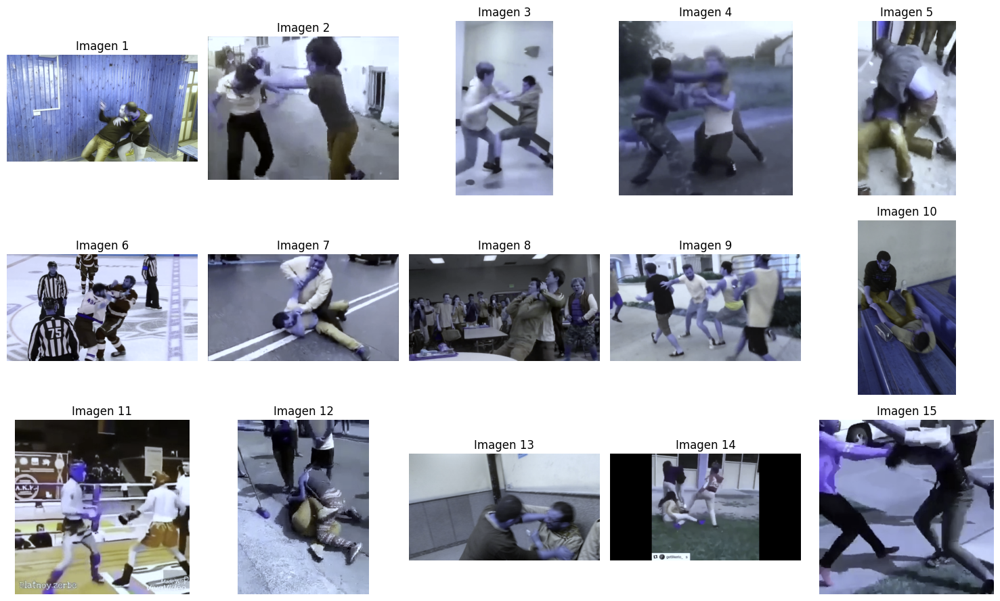

In [85]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='XYZ')
mostrar_imagenes_en_subplots(imagenes_espaciocolor)

## Función canales espacios de color

In [86]:
def dividir_imagenes_por_canales(imagenes_convertidas, espacio_color='RGB'):
    imagenes_por_canales = {}

    # Definir nombres de los canales según el espacio de color
    canales_por_espacio = {
        'RGB': ['R', 'G', 'B'],
        'HSV': ['H', 'S', 'V'],
        'LAB': ['L', 'A', 'B'],
        'YCrCb': ['Y', 'Cr', 'Cb'],
        'YUV': ['Y', 'U', 'V'],
        'HLS': ['H', 'L', 'S'],
        'XYZ': ['X', 'Y', 'Z']
    }

    # Verificar si el espacio de color elegido está disponible
    if espacio_color not in canales_por_espacio:
        raise ValueError(f"Espacio de color '{espacio_color}' no reconocido. Seleccione entre: {list(canales_por_espacio.keys())}")

    # Dividir cada imagen en sus canales correspondientes
    for nombre_variable, imagen in imagenes_convertidas.items():
        canales = cv2.split(imagen)  # Divide la imagen en sus canales
        nombres_canales = canales_por_espacio[espacio_color]

        # Asociar cada canal con su nombre correspondiente (por ejemplo, 'R', 'G', 'B')
        imagenes_por_canales[nombre_variable] = {nombres_canales[i]: canales[i] for i in range(len(canales))}

    return imagenes_por_canales


In [87]:
def extraer_canal(imagenes_divididas, canal):
    imagenes_canal = {}
    
    for nombre, canales in imagenes_divididas.items():
        if canal in canales:
            imagenes_canal[nombre] = canales[canal]
        else:
            raise ValueError(f"El canal '{canal}' no existe en la imagen {nombre}")
    
    return imagenes_canal

### División en el espacio escogido

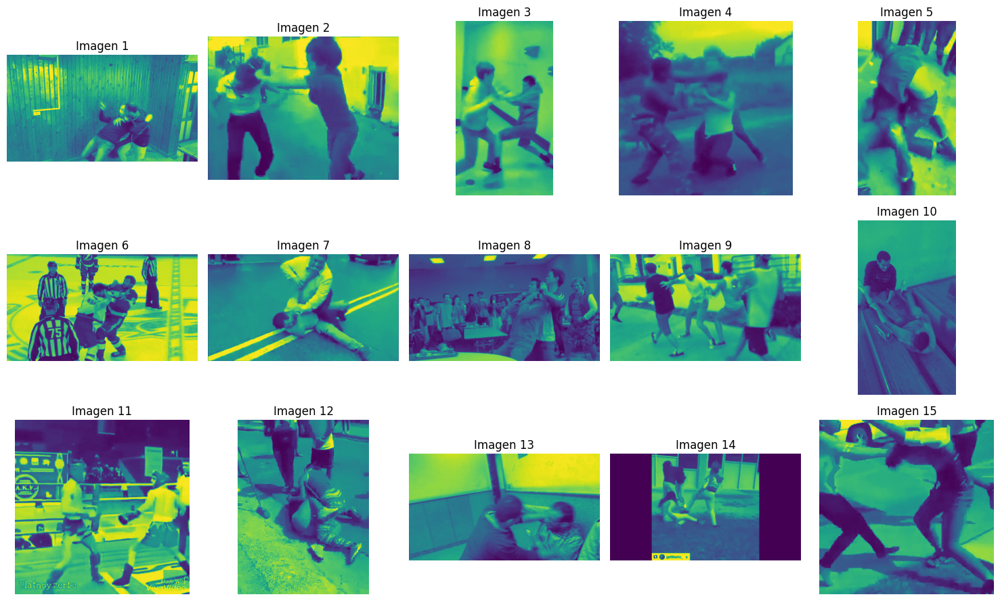

In [94]:
imagenes_espaciocolor = convertir_imagenes_espacio_color(imagenes_procesadas, espacio_color='HLS')
imagenes_divididas = dividir_imagenes_por_canales(imagenes_espaciocolor, 'HLS')
imagenes_canal = extraer_canal(imagenes_divididas, 'L')
mostrar_imagenes_en_subplots2(imagenes_canal)
#YUV -> Y
#RGB -> G 
#HSV -> V
#LAB -> L
#XYZ -> X !
#YCrCb
#HLS -> L

## Funcipo CLAHE

In [95]:
def aplicar_CLAHE_a_imagenes(imagenes_grises, clipLimit=5, agregar_brillo=30):
    # Crear el objeto CLAHE con el clipLimit dado
    clahe = cv2.createCLAHE(clipLimit=clipLimit)
    
    # Diccionario para almacenar las imágenes con CLAHE aplicado
    imagenes_clahe = {}
    
    # Aplicar CLAHE a cada imagen en el diccionario de imágenes grises
    for nombre_variable, imagen in imagenes_grises.items():
        # Aplicar CLAHE a la imagen en escala de grises y sumar brillo
        final_img = clahe.apply(imagen) + agregar_brillo
        
        # Almacenar la imagen resultante en el diccionario
        imagenes_clahe[nombre_variable] = final_img
    
    return imagenes_clahe


In [96]:
#imagenes_clahe = aplicar_CLAHE_a_imagenes(imagenes_grises) #imagenes_grises
#mostrar_imagenes_en_subplots(imagenes_clahe)

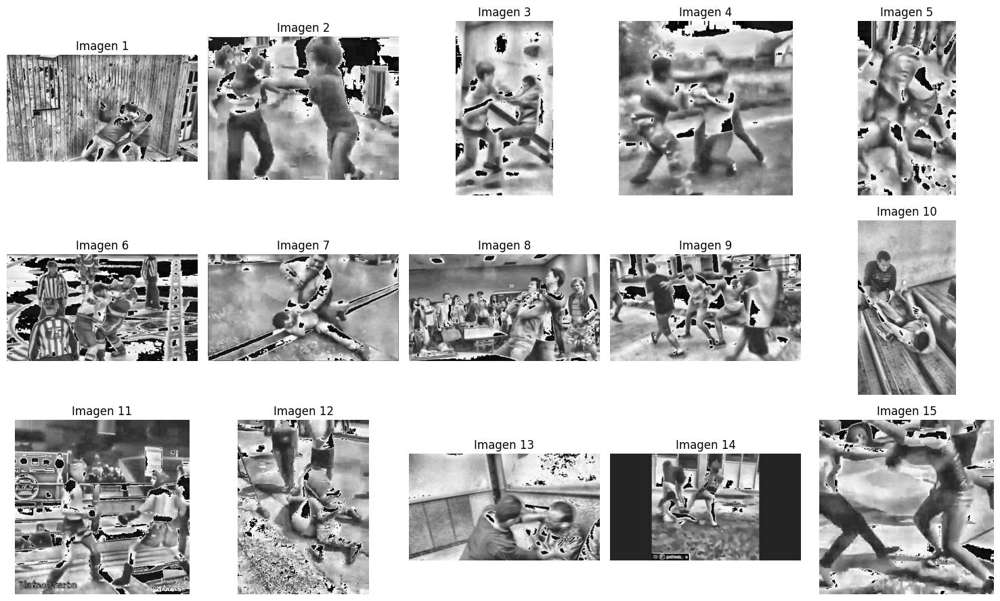

In [100]:
imagenes_clahe = aplicar_CLAHE_a_imagenes(imagenes_canal) 
mostrar_imagenes_en_subplots(imagenes_clahe)

## Función binarización cruda imagen

In [98]:
# Función para binarizar imágenes en escala de grises
def binarizar_imagenes(imagenes_grises, umbral=50):
    imagenes_binarizadas = {}
    
    # Aplicar binarización a cada imagen en escala de grises
    for nombre_variable, imagen_gray in imagenes_grises.items():
        _, imagen_binarizada = cv2.threshold(imagen_gray, umbral, 250, cv2.THRESH_BINARY)
        imagenes_binarizadas[nombre_variable] = imagen_binarizada
    
    return imagenes_binarizadas

In [99]:
#imagenes_binarias = binarizar_imagenes(imagenes_grises)
#mostrar_imagenes_en_subplots(imagenes_binarias)

## Función binarización adaptativa imagen

In [37]:
def aplicar_adaptive_mean_threshold(imagenes_grises):
    imagenes_binarizadas = {}
    # Aplicar Adaptive Mean Thresholding
    for nombre_variable, imagen_gray in imagenes_grises.items():
        imagen_binarizada = cv2.adaptiveThreshold(imagen_gray, 255, 
                                              cv2.ADAPTIVE_THRESH_MEAN_C, 
                                              cv2.THRESH_BINARY, 
                                              11, 2)
        imagenes_binarizadas[nombre_variable] = imagen_binarizada
    return imagenes_binarizadas

In [38]:
#imagenes_binarias_adaptive = aplicar_adaptive_mean_threshold(imagenes_grises)
#mostrar_imagenes_en_subplots(imagenes_binarias_adaptive)

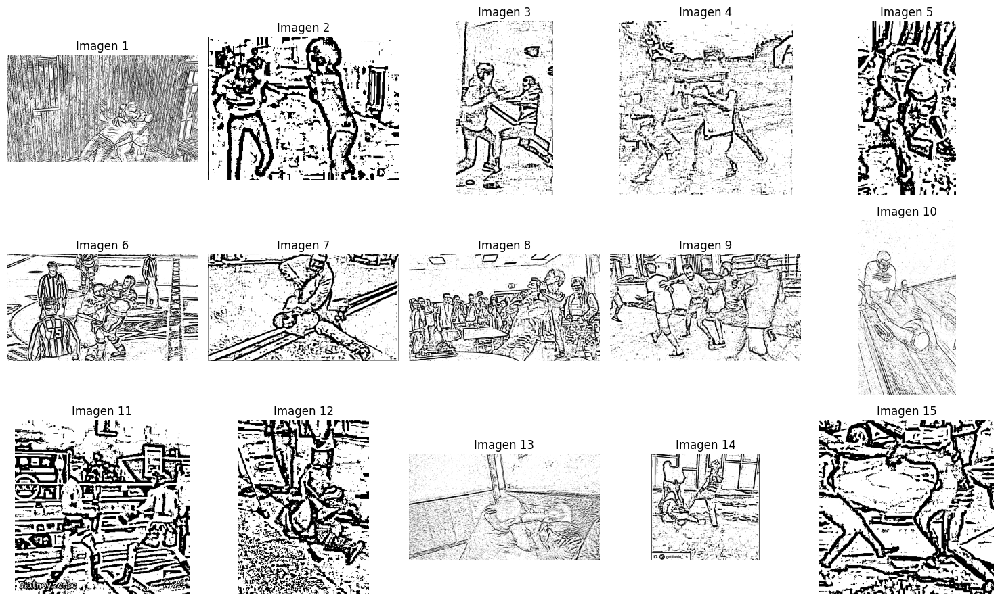

In [101]:
imagenes_binarias_adaptive = aplicar_adaptive_mean_threshold(imagenes_canal)
mostrar_imagenes_en_subplots(imagenes_binarias_adaptive)

## Kernels

In [102]:
#OpenVC
kernel_cruz = cv2.getStructuringElement(cv2.MORPH_CROSS,(13,13))
kernel_rectangulo = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
kernel_elipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))

#skimage
kernel_unos = square(12)
kernel_rectangulo_ski = rectangle(3, 5)
kernel_diamante = diamond(7)
kernel_disco = disk(5)
kernel_octagono = octagon(9, 5)

## Función operaciones morfológicas

In [103]:
def aplicar_operacion_morfologica_a_imagenes(imagenes, tipo_operacion='erosion', tipo_kernel='rectangulo', kernel_size=5,kernel_size2=5, iteraciones=1):
    imagenes_procesadas = {}

    # Crear el elemento estructurante (kernel) según el tipo seleccionado
    if tipo_kernel == 'cruz':
        element = cv2.getStructuringElement(cv2.MORPH_CROSS, (kernel_size, kernel_size))
    elif tipo_kernel == 'rectangulo':
        element = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    elif tipo_kernel == 'elipse':
        element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    elif tipo_kernel == 'square':
        element = square(kernel_size)
    elif tipo_kernel == 'rectangle':
        #element = rectangle(kernel_size, int(kernel_size * 1.5))
        element = rectangle(kernel_size, kernel_size2)
    elif tipo_kernel == 'diamond':
        element = diamond(kernel_size)
    elif tipo_kernel == 'disk':
        element = disk(kernel_size)
    elif tipo_kernel == 'octagon':
        #element = octagon(kernel_size, int(kernel_size / 2))
        element = octagon(kernel_size, kernel_size2)
    else:
        raise ValueError(f"Tipo de kernel '{tipo_kernel}' no reconocido")

    # Aplicar la operación morfológica seleccionada
    for nombre_variable, imagen in imagenes.items():
        if tipo_operacion == 'erosion':
            imagen_procesada = cv2.erode(imagen, element, iterations=iteraciones)
        elif tipo_operacion == 'dilatacion':
            imagen_procesada = cv2.dilate(imagen, element, iterations=iteraciones)
        elif tipo_operacion == 'opening':
            imagen_procesada = cv2.morphologyEx(imagen, cv2.MORPH_OPEN, element, iterations=iteraciones)
        elif tipo_operacion == 'closing':
            imagen_procesada = cv2.morphologyEx(imagen, cv2.MORPH_CLOSE, element, iterations=iteraciones)
        else:
            raise ValueError(f"Tipo de operación '{tipo_operacion}' no reconocido")
        
        imagenes_procesadas[nombre_variable] = imagen_procesada
    
    return imagenes_procesadas

In [70]:
#imagenes_dilatadas = aplicar_operacion_morfologica_a_imagenes(imagenes_binarias_adaptive, tipo_operacion='dilatacion', tipo_kernel='diamond', kernel_size=1,kernel_size2=3, iteraciones=1)
#mostrar_imagenes_en_subplots(imagenes_dilatadas)

## Dilatadas

In [71]:
### con Kernel diamond(1)

In [72]:
#imagenes_dilatadas = aplicar_operacion_morfologica_a_imagenes(imagenes_binarias_adaptive, tipo_operacion='dilatacion', tipo_kernel='diamond', kernel_size=1,kernel_size2=3, iteraciones=1)
#mostrar_imagenes_en_subplots(imagenes_dilatadas)

## Erosionadas

In [73]:
### con Kernel diamond(1)

In [74]:
#imagenes_erosionadas = aplicar_operacion_morfologica_a_imagenes(imagenes_binarias_adaptive, tipo_operacion='erosion', tipo_kernel='diamond', kernel_size=1,kernel_size2=3, iteraciones=1)
#mostrar_imagenes_en_subplots(imagenes_erosionadas)

## With Opening

In [64]:
#imagenes_opening = aplicar_operacion_morfologica_a_imagenes(imagenes_clahe, tipo_operacion='opening', tipo_kernel='octagon', kernel_size=10,kernel_size2=3, iteraciones=1)
#mostrar_imagenes_en_subplots(imagenes_opening) #imagenes_binarias_adaptive

## With Closing

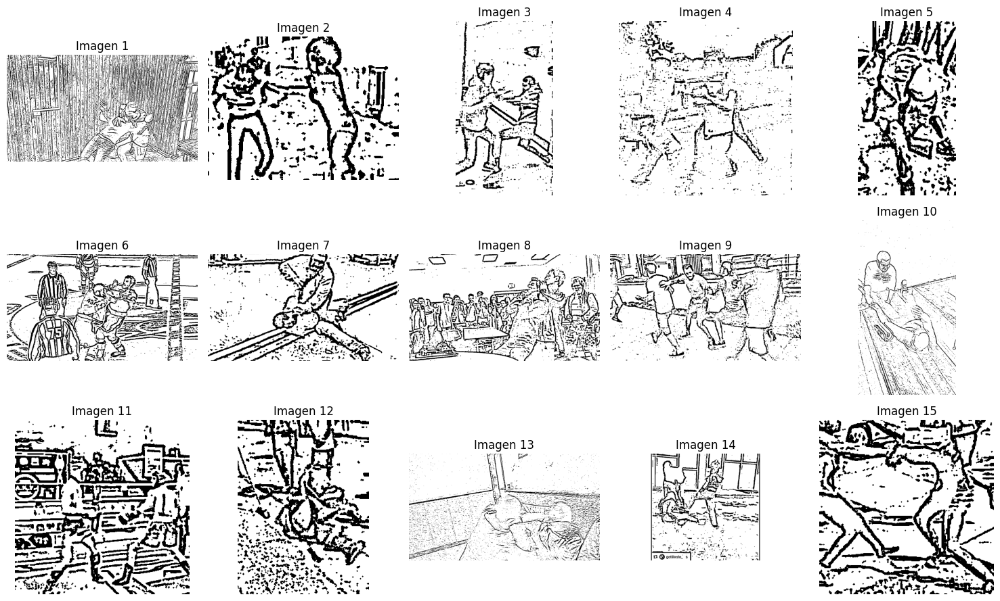

In [105]:
imagenes_opening = aplicar_operacion_morfologica_a_imagenes(imagenes_binarias_adaptive, tipo_operacion='closing', tipo_kernel='diamond', kernel_size=1,kernel_size2=3, iteraciones=1)
mostrar_imagenes_en_subplots(imagenes_opening)

## Función segmtencación No supervisada

### Segmentation by Thresholding 

In [77]:
def aplicar_thresholding (imagenes_grises, metodo="otsu"):
    imagenes_segmentadas = {}

    # Selección del método de umbral basado en el parámetro 'metodo'
    for nombre_variable, imagen in imagenes_grises.items():
        if metodo.lower() == "otsu":
            # Umbral de Otsu
            threshold = filters.threshold_otsu(imagen)
            binarized_image = (imagen > threshold) * 1

        elif metodo.lower() == "niblack":
            # Umbral de Niblack
            threshold = filters.threshold_niblack(imagen)
            binarized_image = (imagen > threshold) * 1

        elif metodo.lower() == "sauvola":
            # Umbral de Sauvola
            threshold = filters.threshold_sauvola(imagen)
            binarized_image = (imagen > threshold) * 1

        else:
            print(f"Método {metodo} no reconocido. Usa 'otsu', 'niblack' o 'sauvola'.")
            return None

        # Guardar la imagen segmentada
        imagenes_segmentadas[nombre_variable] = binarized_image

    return imagenes_segmentadas

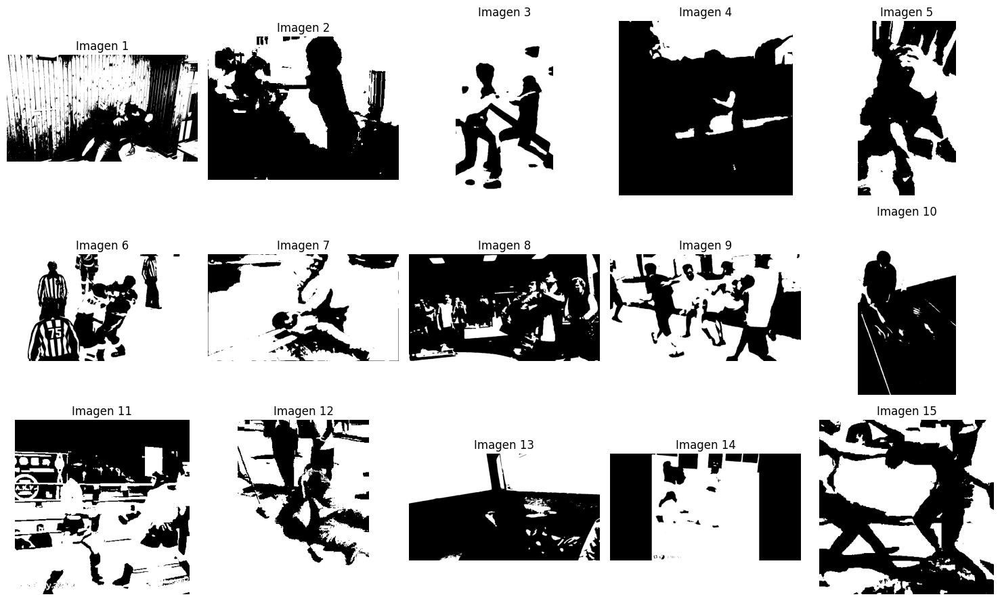

In [78]:
imagenes_segmentadas = aplicar_thresholding(imagenes_grises, metodo='otsu')
mostrar_imagenes_en_subplots(imagenes_segmentadas)

### Active Contour Segmentation

In [79]:
# Definición de la función para aplicar Active Contour a un conjunto de imágenes
def aplicar_active_contour(imagenes_grises, centro_circulo, radio_circulo, sigma=1):
    imagenes_segmentadas = {}

    for nombre_variable, imagen in imagenes_grises.items():
        # Aplicar filtro Gaussiano para eliminar el ruido
        imagen_noiseless = gaussian(imagen, sigma)

        # Generar el círculo inicial basado en el centro y el radio proporcionados
        x1 = centro_circulo[0] + radio_circulo * np.cos(np.linspace(0, 2 * np.pi, 500))
        x2 = centro_circulo[1] + radio_circulo * np.sin(np.linspace(0, 2 * np.pi, 500))

        # Definir la estructura del snake como el contorno inicial
        snake = np.array([x1, x2]).T

        # Aplicar Active Contour
        contorno_segmentado = active_contour(imagen_noiseless, snake)

        # Guardar el resultado en el diccionario
        imagenes_segmentadas[nombre_variable] = contorno_segmentado

    return imagenes_segmentadas


In [80]:
centro_circulo = (220, 110)  # Coordenadas del centro del círculo
radio_circulo = 100  # Radio del círculo
imagenes_segmentadas = aplicar_active_contour(imagenes_grises, centro_circulo, radio_circulo)

In [86]:
#mostrar_imagenes_en_subplots(imagenes_segmentadas)

## Función segmtencación supervisada

### Chan-Vese Segmentation

In [82]:
def aplicar_chan_vese_a_imagenes(imagenes_grises, iteraciones):
    imagenes_segmentadas = {}
    #for imagen in imagenes_grises:
    for nombre_variable, imagen in imagenes_grises.items():
        # Aplicar segmentación Chan-Vese
        segmented_image = chan_vese(imagen, max_num_iter= iteraciones, extended_output=False)
        # Almacenar la imagen segmentada
        imagenes_segmentadas[nombre_variable] = segmented_image
    return imagenes_segmentadas

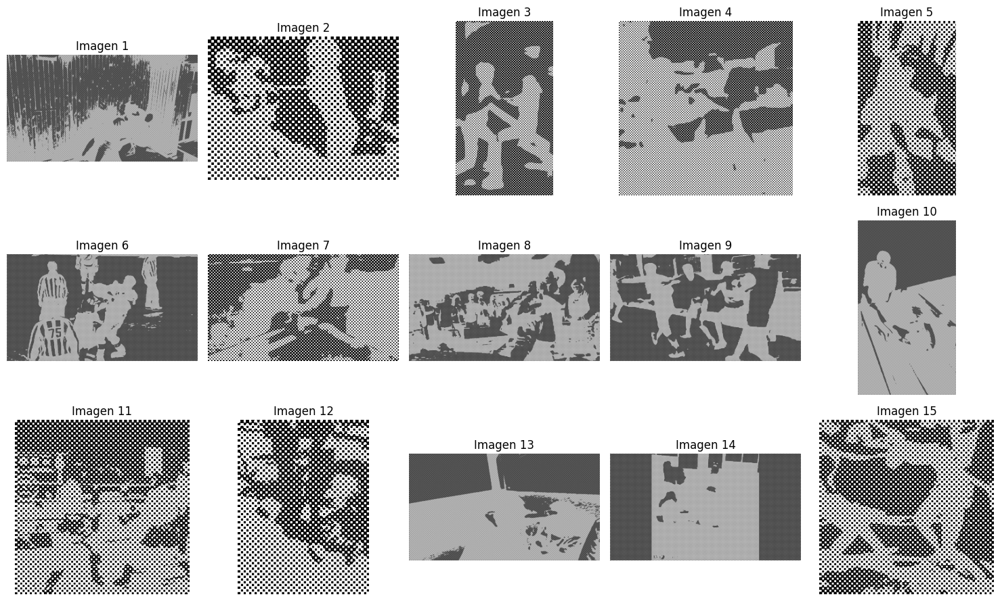

In [83]:
imagenes_segmentadas = aplicar_chan_vese_a_imagenes(imagenes_grises, 5)
mostrar_imagenes_en_subplots(imagenes_segmentadas)

### SLIC segmentation

In [84]:
def aplicar_slic_a_imagenes(imagenes_grises, n_segments=50, compactness=10):
    imagenes_segmentadas = {}
    #for imagen in imagenes_grises:
    for nombre_variable, imagen in imagenes_grises.items():
        # Aplicar segmentación Chan-Vese
        segmented_image = slic(imagen, n_segments= n_segments, compactness=compactness)
        # Almacenar la imagen segmentada
        imagenes_segmentadas[nombre_variable] = segmented_image
    return imagenes_segmentadas


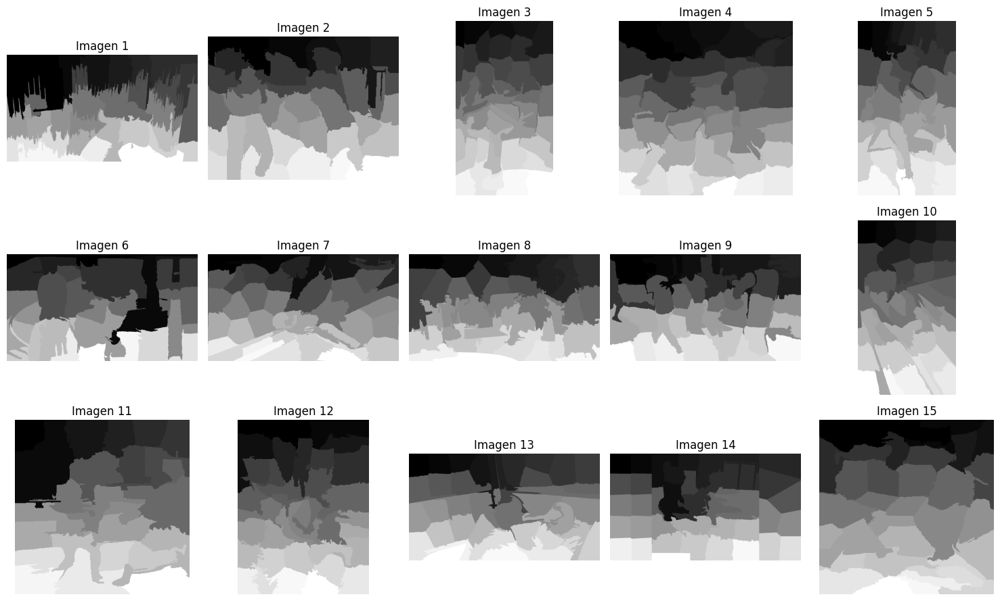

In [85]:
imagenes_segmentadas = aplicar_slic_a_imagenes(imagenes_procesadas, n_segments=50, compactness=10)
mostrar_imagenes_en_subplots(imagenes_segmentadas)